In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot
import igraph
import scvelo as scv 
import loompy as lmp
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix 
import os 

In [2]:
import loompy

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.9.6 anndata==0.10.4 umap==0.5.5 numpy==1.24.3 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 igraph==0.10.8 louvain==0.8.2 pynndescent==0.5.11


In [6]:
adata= sc.read_10x_mtx("filtered_gene_bc_matrices/IPF1Lin/", 
                       var_names= "gene_symbols", cache= True)

... reading from cache file cache\filtered_gene_bc_matrices-IPF1Lin-matrix.h5ad


In [7]:
adata.var_names_make_unique()

In [8]:
adata.obs_names

Index(['AAACCTGAGCGATTCT-1', 'AAACCTGAGTAGATGT-1', 'AAACCTGCAACTGCGC-1',
       'AAACCTGCACCACGTG-1', 'AAACCTGCAGCTCGCA-1', 'AAACCTGCATCCCACT-1',
       'AAACCTGCATTCTCAT-1', 'AAACCTGGTAGCCTCG-1', 'AAACCTGGTATAGTAG-1',
       'AAACGGGAGCGTTCCG-1',
       ...
       'TTTGGTTGTCTAGCGC-1', 'TTTGGTTTCCGGCACA-1', 'TTTGTCAAGAGCCCAA-1',
       'TTTGTCAAGCGTAGTG-1', 'TTTGTCACAATCGGTT-1', 'TTTGTCAGTAAACGCG-1',
       'TTTGTCAGTCGCTTTC-1', 'TTTGTCAGTGACTACT-1', 'TTTGTCATCACTTACT-1',
       'TTTGTCATCTAGCACA-1'],
      dtype='object', length=4395)

normalizing counts per cell
    finished (0:00:00)


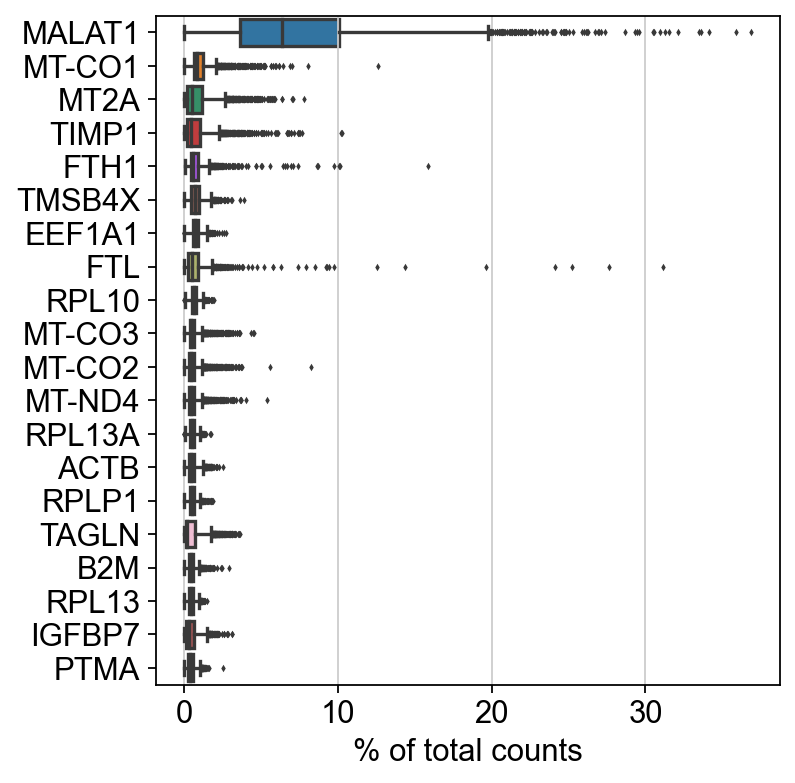

In [9]:
# preprocessing 
sc.pl.highest_expr_genes(adata, n_top=20)

In [10]:
#Basic filtering 
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 4 cells that have less than 200 genes expressed
filtered out 16166 genes that are detected in less than 3 cells


In [11]:
# Let’s assemble some information about mitochondrial genes, which are important for quality control.
# annotate the group of mitochondrial genes as "mt"
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

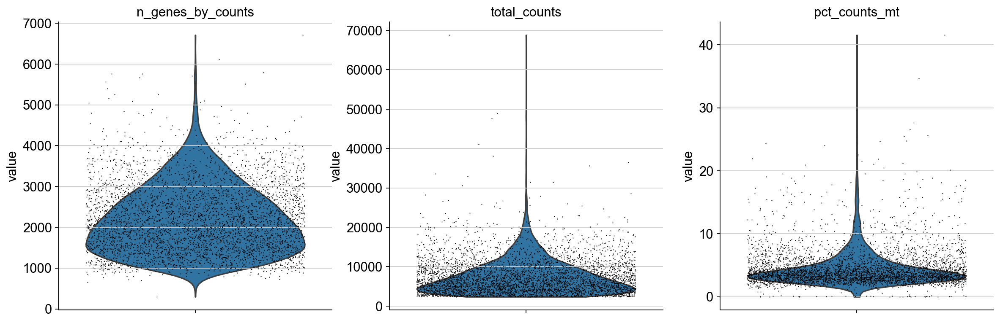

In [12]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [13]:
adata= adata[adata.obs.n_genes_by_counts <5000, :]
adata= adata[adata.obs.total_counts <30000, :]
adata= adata[adata.obs.pct_counts_mt <20, :]

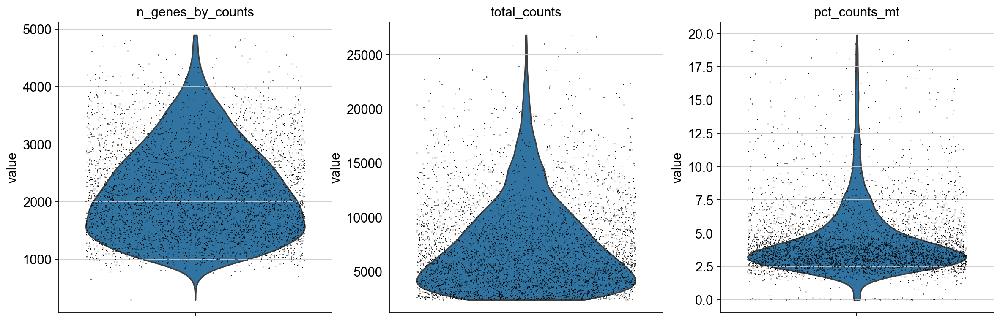

In [14]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [15]:
# write proprocessing obj! 
adata.write("filtered_gene_bc_matrices/IPF1Lin/IPF1Lin.h5ad")

In [16]:
# data normalization
sc.pp.normalize_total(adata, target_sum=1e4)


normalizing counts per cell
    finished (0:00:00)


In [17]:
sc.pp.log1p(adata)

In [18]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp= 0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


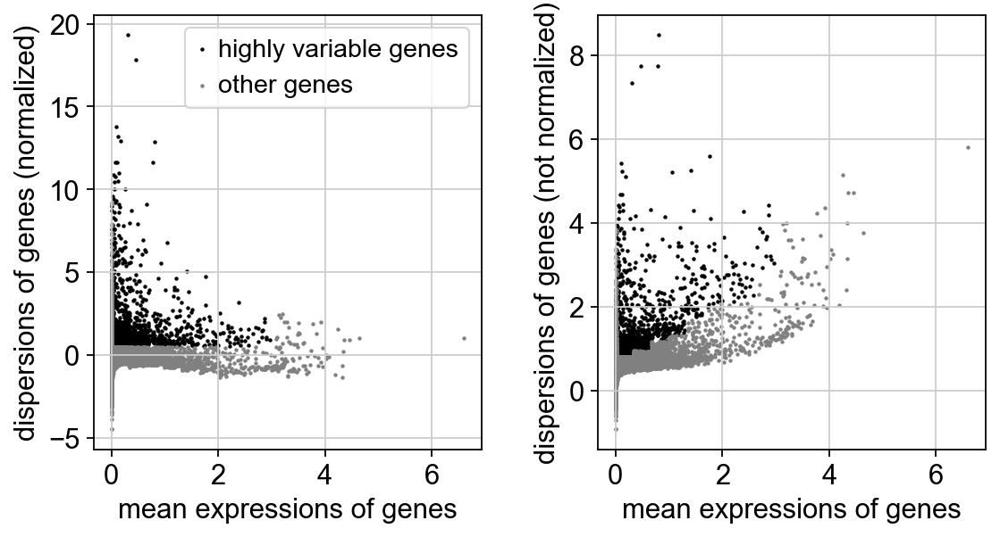

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
adata.raw= adata

In [21]:
adata= adata[:, adata.var.highly_variable]

In [22]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:16)


In [29]:
sc.pp.scale(adata, max_value= 10)

In [31]:
# Principal component analysis
sc.tl.pca(adata, svd_solver="arpack")

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


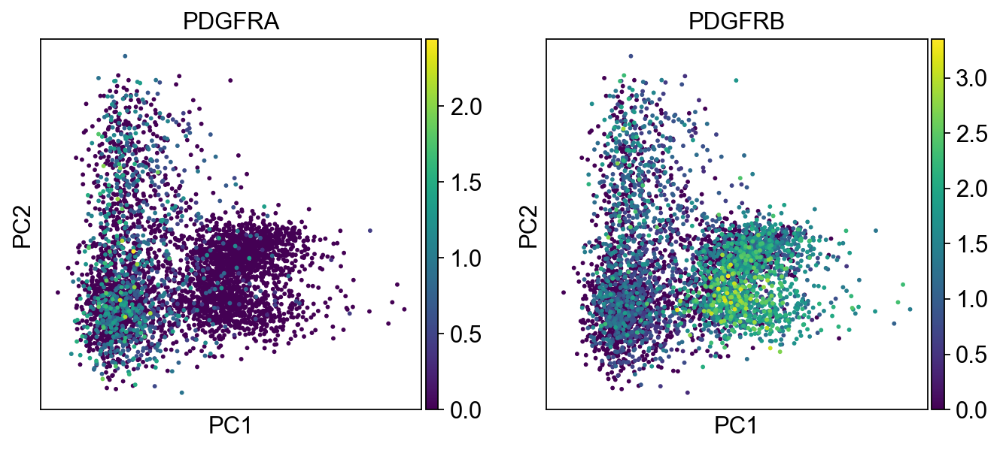

In [32]:
sc.pl.pca(adata, color= ['PDGFRA', 'PDGFRB'])

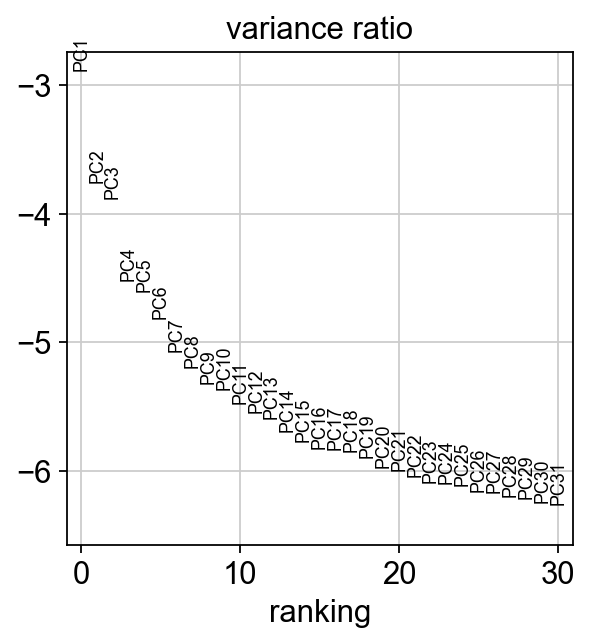

In [33]:
sc.pl.pca_variance_ratio(adata, log=True)

In [34]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [35]:
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.2)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


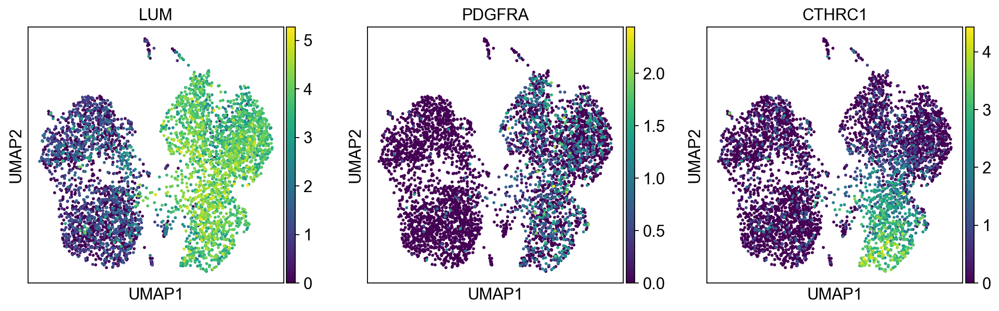

In [36]:
sc.pl.umap(adata, color=["LUM", "PDGFRA", "CTHRC1"])

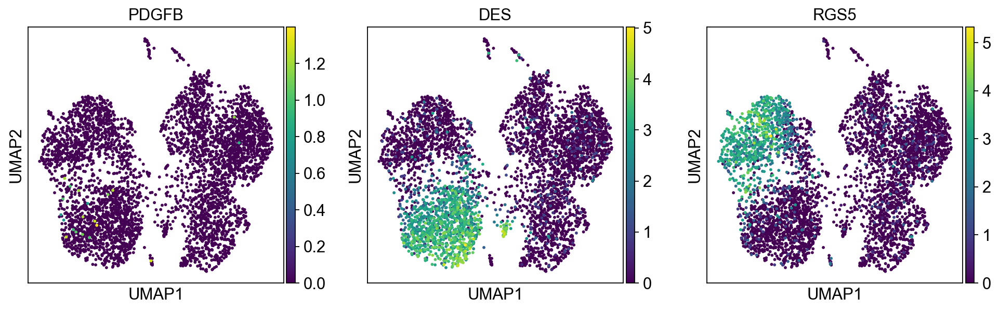

In [37]:
sc.pl.umap(adata, color=["PDGFB", "DES", "RGS5"])

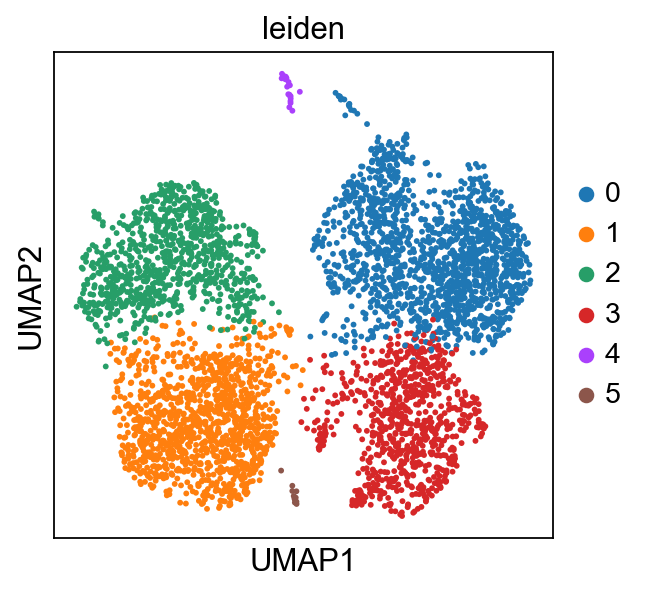

In [38]:
sc.pl.umap(adata, color= "leiden")

In [39]:
new_cluster_names= ['Fibro', 'SMC', 'Pericytes', 'Myo_fibro', 'IM', 'Endo']
adata.rename_categories('leiden', new_cluster_names)

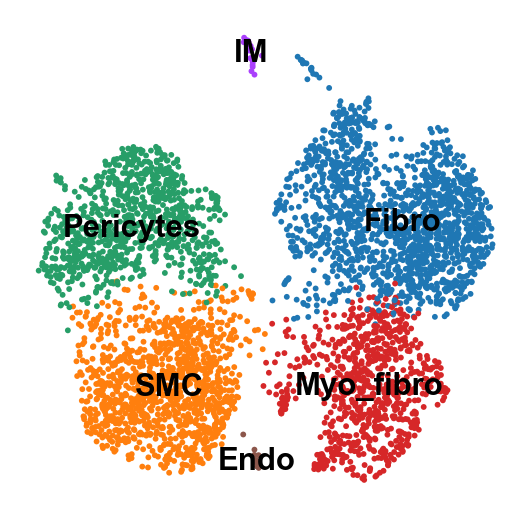

In [40]:
sc.pl.umap(adata, color='leiden', legend_loc= 'on data', title= '', frameon= False, save='.pdf')

In [41]:
adata

AnnData object with n_obs × n_vars = 4354 × 1392
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [42]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCTGAGCGATTCT-1,2785,2783,11170.0,751.0,6.723366,Pericytes
AAACCTGAGTAGATGT-1,2052,2049,5701.0,462.0,8.103842,Myo_fibro
AAACCTGCAACTGCGC-1,3647,3645,16714.0,444.0,2.656456,Fibro
AAACCTGCACCACGTG-1,2843,2842,9678.0,257.0,2.655507,Fibro
AAACCTGCAGCTCGCA-1,1640,1639,4709.0,500.0,10.617966,Pericytes
...,...,...,...,...,...,...
TTTGTCAGTAAACGCG-1,1717,1716,6137.0,291.0,4.741731,Fibro
TTTGTCAGTCGCTTTC-1,2907,2903,9176.0,216.0,2.353967,Fibro
TTTGTCAGTGACTACT-1,2718,2717,9393.0,246.0,2.618972,Fibro
TTTGTCATCACTTACT-1,2436,2435,7721.0,220.0,2.849372,Fibro


In [44]:
adata.write("filtered_gene_bc_matrices/IPF1Lin/IPF1Lin.h5ad")

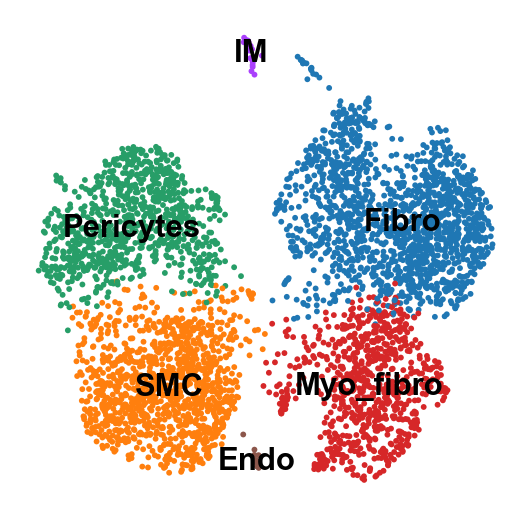

In [45]:
# core plot 
sc.pl.umap(adata, color= 'leiden', legend_loc= "on data", title= '', frameon= False)

In [48]:
Mesen= ['Fibro', 'Myo_fibro', 'Pericytes', 'SMC']
adata= adata[adata.obs.leiden.isin(Mesen)]

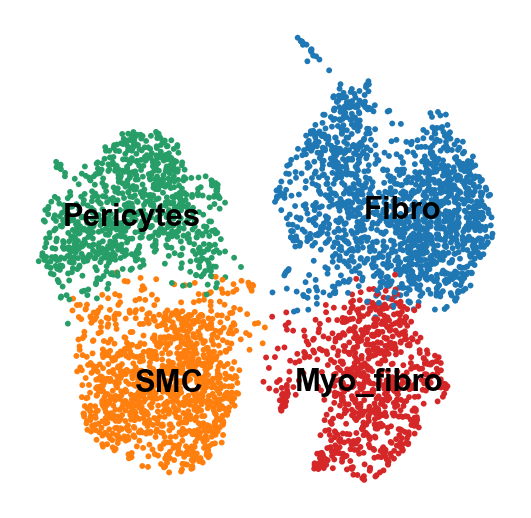

In [49]:
sc.pl.umap(adata, color= 'leiden', legend_loc= "on data", title= '', frameon= False)

In [50]:
sc.tl.tsne(adata)
sc.tl.dendrogram(adata, groupby= 'leiden')

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:17)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


In [51]:
adata

AnnData object with n_obs × n_vars = 4323 × 1392
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'tsne', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

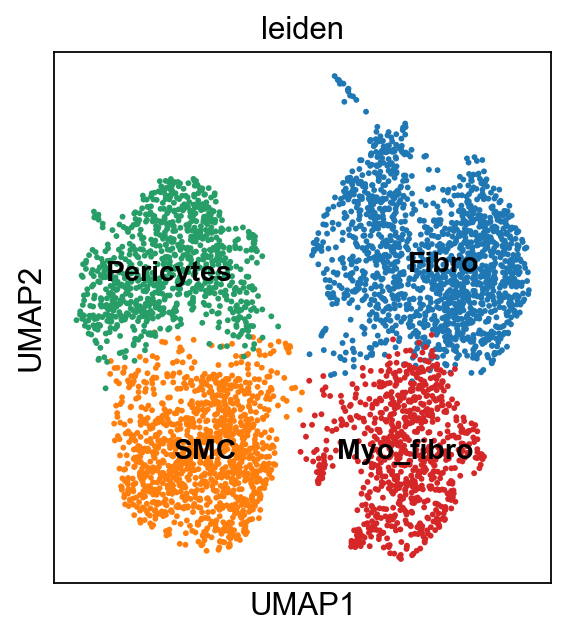

In [52]:
sc.pl.scatter(adata, color= 'leiden', basis= 'umap', legend_loc= 'on data')

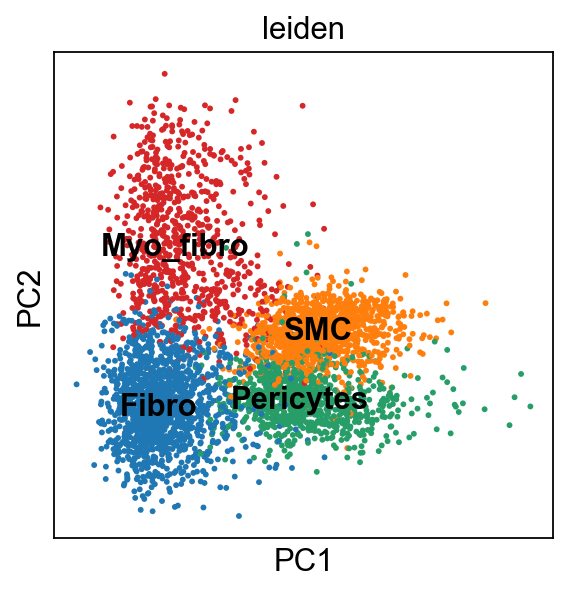

In [53]:
sc.pl.pca(adata, color= "leiden", legend_loc= "on data")

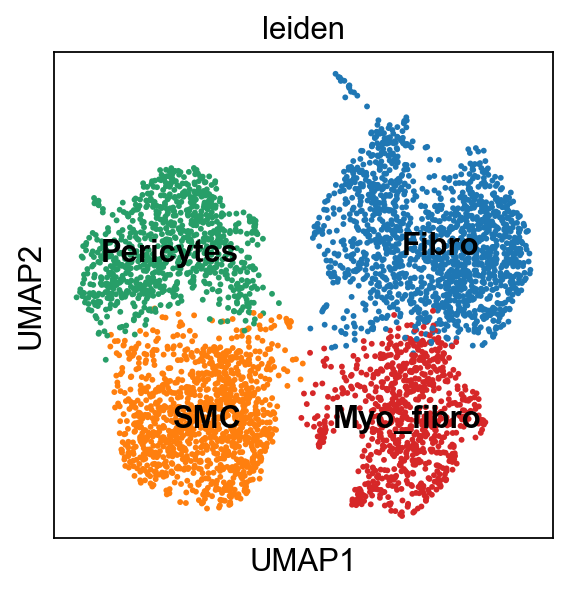

In [54]:
sc.pl.umap(adata, color= 'leiden', legend_loc= "on data" )

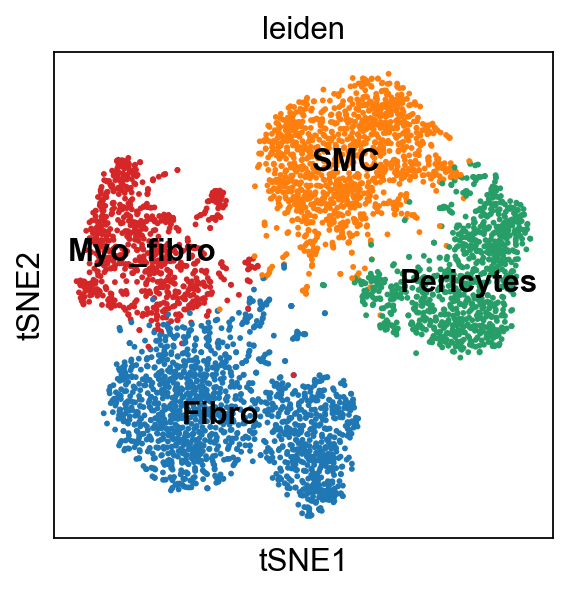

In [55]:
sc.pl.tsne(adata, color= 'leiden', legend_loc= "on data" )

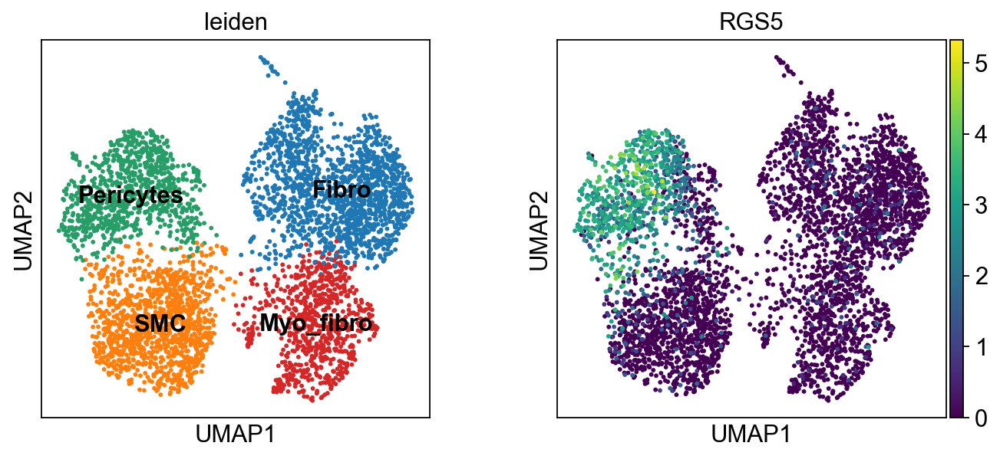

In [56]:
sc.pl.umap(adata, color= ['leiden', 'RGS5'], legend_loc= 'on data')

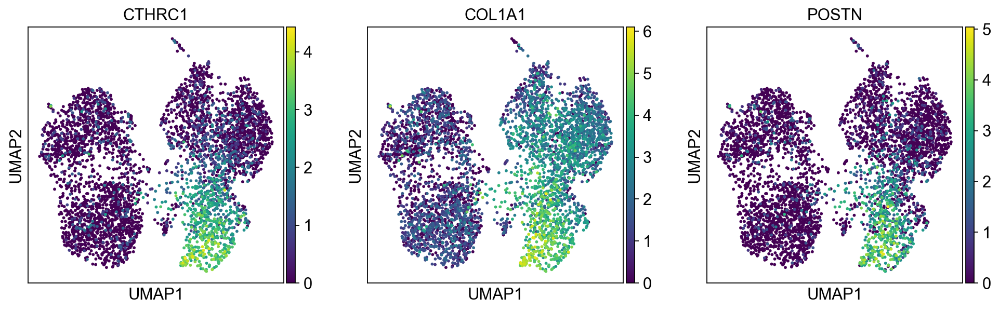

In [57]:
sc.pl.umap(adata, color= ['CTHRC1', 'COL1A1', 'POSTN'])

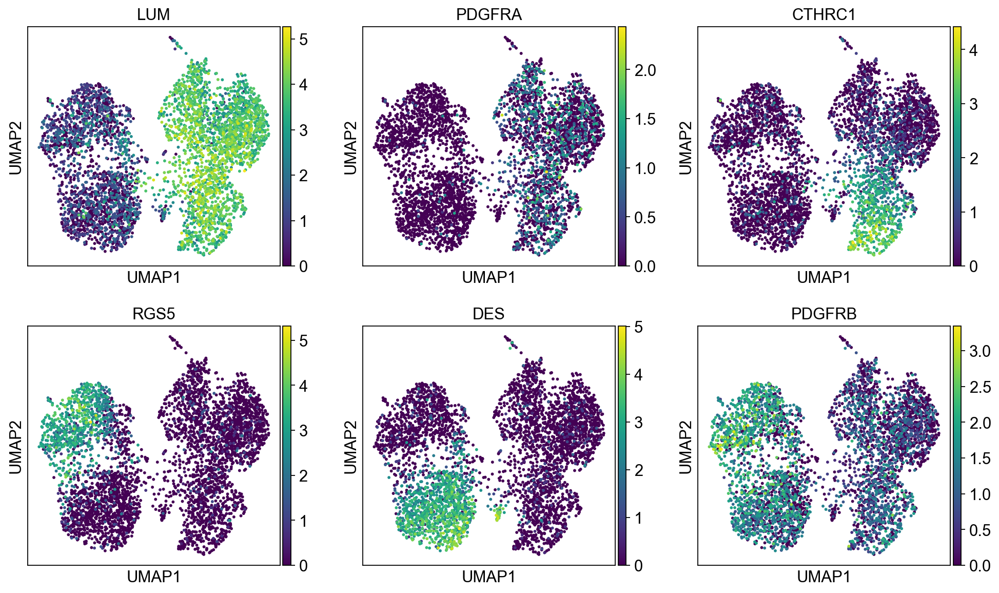

In [58]:
sc.pl.umap(adata, color= ['LUM', 'PDGFRA', 'CTHRC1', 'RGS5', 'DES', 'PDGFRB'], ncols= 3)

In [66]:
from matplotlib import rc_context

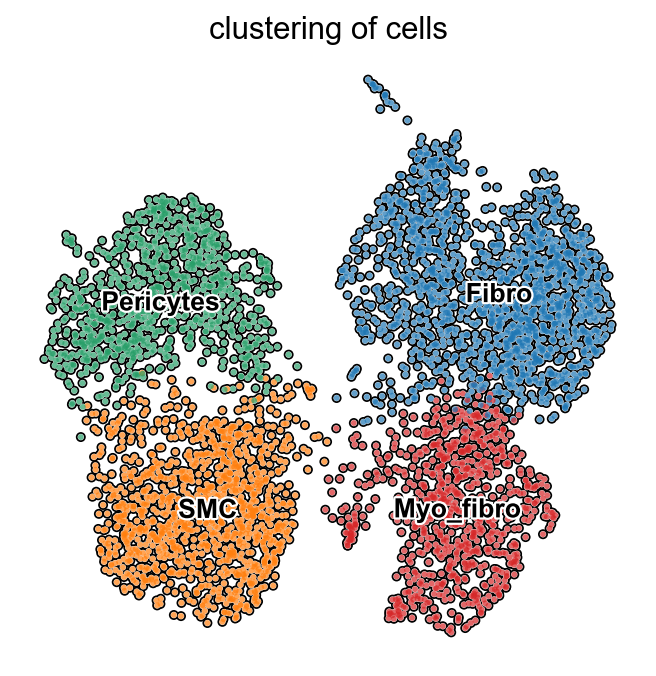

In [62]:
with rc_context({'figure.figsize': (5,5)}): 
    sc.pl.umap(adata, color= 'leiden', add_outline= True, legend_loc= 'on data', 
              legend_fontsize= 12, legend_fontoutline= 2, frameon= False, 
               title= "clustering of cells")

In [63]:
marker_genes_dict= {
    'Fibro': ['LUM', 'DCN', 'PDGFRA'], 
    'Myo_fibro': ['CTHRC1', 'COL1A1', 'POSTN'], 
    'Pericytes': ['RGS5', 'PDGFRB', 'COX4I2'], 
    'SMC': ['DES', 'MYH11', 'MYL9']
}

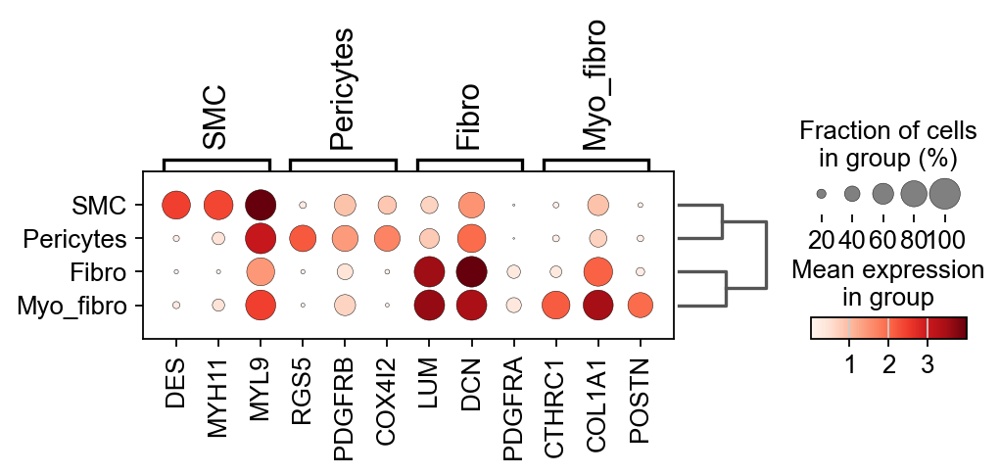

In [64]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', dendrogram= True)

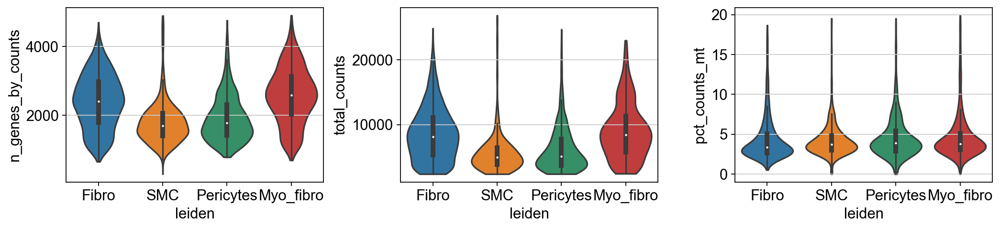

In [67]:
with rc_context({'figure.figsize': (4.5, 3)}): 
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], groupby= 'leiden', stripplot= False, inner= 'box')

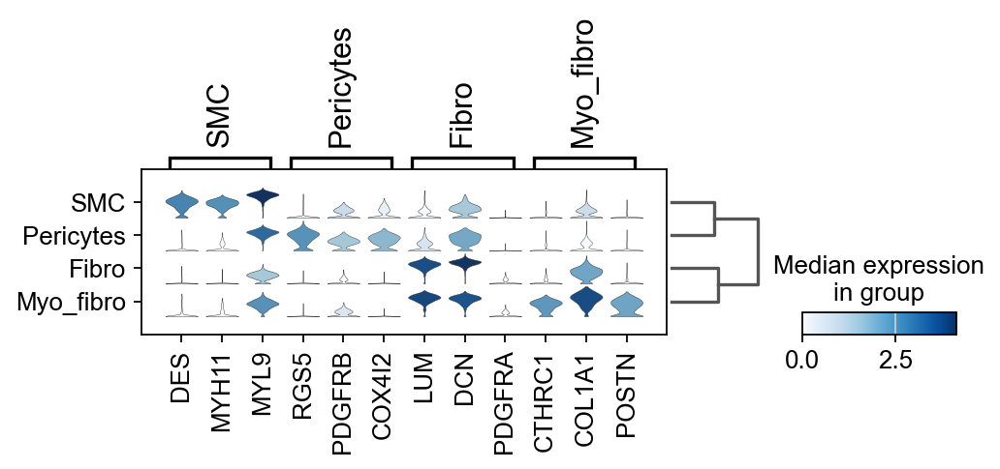

In [68]:
ax= sc.pl.stacked_violin(adata, marker_genes_dict, groupby='leiden', swap_axes= False, dendrogram= True)

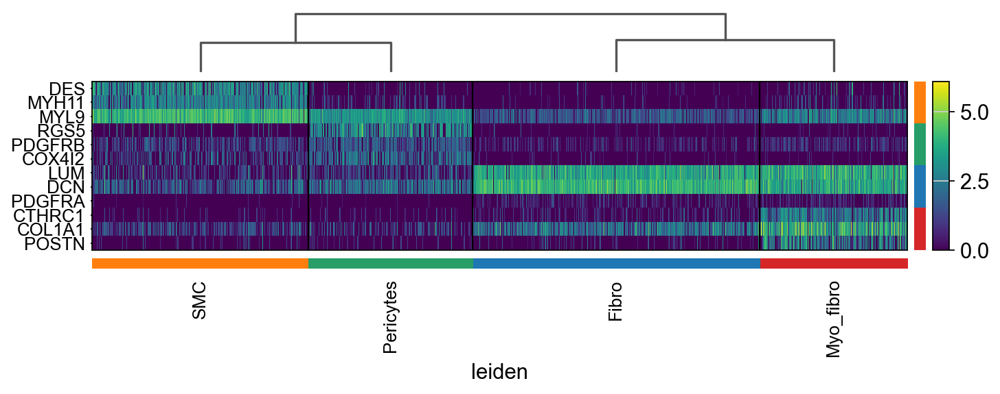

In [69]:
ax= sc.pl.heatmap(adata, marker_genes_dict, groupby= 'leiden', cmap= 'viridis', dendrogram= True, swap_axes= True)

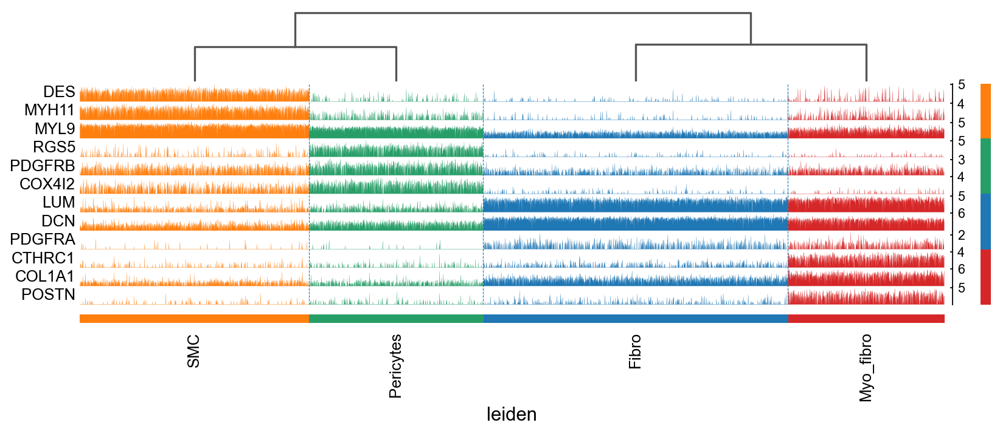

In [70]:
ax= sc.pl.tracksplot(adata, marker_genes_dict, groupby= 'leiden', cmap= 'viridis', dendrogram= True, swap_axes= True)

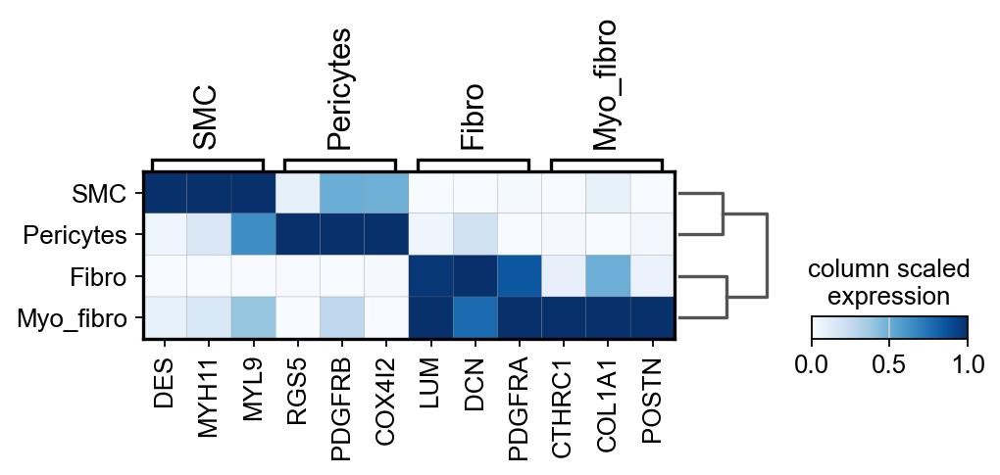

In [71]:
sc.pl.matrixplot(adata, marker_genes_dict, 'leiden', dendrogram= True, cmap= 'Blues', standard_scale= 'var', colorbar_title='column scaled\nexpression')

In [72]:
#find marker genes 
sc.tl.rank_genes_groups(adata, 'leiden', method= 'wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)


In [73]:
adata

AnnData object with n_obs × n_vars = 4323 × 1392
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'tsne', 'dendrogram_leiden', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [74]:
adata.uns['rank_genes_groups']

{'params': {'groupby': 'leiden',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('CFD', 'ADIRF', 'IGFBP7', 'COL8A1'),
            ('PTGDS', 'MYH11', 'RGS5', 'CTHRC1'),
            ('MGST1', 'MYL9', 'GPX3', 'ASPN'), ...,
            ('ACTA2', 'FBLN1', 'NDUFA4', 'SOD3'),
            ('CALD1', 'COL1A2', 'MFAP4', 'GPX3'),
            ('MYL9', 'C1S', 'S100A6', 'IGFBP7')],
           dtype=[('Fibro', 'O'), ('SMC', 'O'), ('Pericytes', 'O'), ('Myo_fibro', 'O')]),
 'scores': rec.array([( 49.570415,  46.22967 ,  36.0934  ,  36.672676),
            ( 46.553215,  44.1118  ,  35.56018 ,  36.045074),
            ( 45.18516 ,  43.8375  ,  34.230537,  36.042038), ...,
            (-38.340557, -37.8862  , -30.892735, -27.393635),
            (-40.657394, -38.426243, -31.245049, -28.231554),
            (-46.476032, -38.89419 , -34.157837, -28.241543)],
           dtype=[('Fibro', '<f4'), ('SMC', '<f4'), ('P

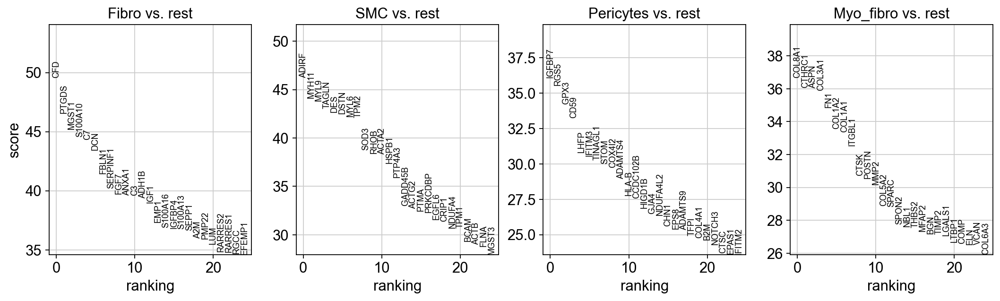

In [75]:
sc.pl.rank_genes_groups(adata, n_genes= 25, sharey= False)

In [78]:
result= adata.uns['rank_genes_groups']
groups= result['names'].dtype.names
df= pd.DataFrame(
    {group + '_' + key[:15]: result[key][group]
    for group in groups for key in ['names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']})

In [79]:
df

,Fibro_names,Fibro_scores,Fibro_pvals,Fibro_pvals_adj,Fibro_logfoldchanges,SMC_names,SMC_scores,SMC_pvals,SMC_pvals_adj,SMC_logfoldchanges,Pericytes_names,Pericytes_scores,Pericytes_pvals,Pericytes_pvals_adj,Pericytes_logfoldchanges,Myo_fibro_names,Myo_fibro_scores,Myo_fibro_pvals,Myo_fibro_pvals_adj,Myo_fibro_logfoldchanges
0,CFD,49.570415,0.000000e+00,0.000000e+00,5.078993,ADIRF,46.229671,0.000000e+00,0.000000e+00,4.474369,IGFBP7,36.093399,2.878671e-285,5.045734e-281,2.159061,COL8A1,36.672676,1.991388e-294,3.490504e-290,4.241262
1,PTGDS,46.553215,0.000000e+00,0.000000e+00,4.558051,MYH11,44.111801,0.000000e+00,0.000000e+00,5.046734,RGS5,35.560181,5.783531e-277,5.068686e-273,5.838456,CTHRC1,36.045074,1.647216e-284,1.073919e-280,5.037655
2,MGST1,45.185162,0.000000e+00,0.000000e+00,4.686022,MYL9,43.837502,0.000000e+00,0.000000e+00,2.814339,GPX3,34.230537,8.497274e-257,4.964674e-253,2.334172,ASPN,36.042038,1.838064e-284,1.073919e-280,4.710827
3,S100A10,44.548599,0.000000e+00,0.000000e+00,3.469036,TAGLN,43.028942,0.000000e+00,0.000000e+00,3.206059,CD59,33.240723,2.779637e-242,9.744294e-239,1.535323,COL3A1,35.898548,3.218368e-282,1.410289e-278,3.502775
4,C7,44.329556,0.000000e+00,0.000000e+00,3.567432,DES,42.648281,0.000000e+00,0.000000e+00,6.088502,LHFP,30.790548,3.506856e-208,7.683521e-205,2.238250,FN1,34.837929,6.485812e-266,2.273666e-262,2.902848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17523,ADIRF,-34.442684,5.794974e-260,3.174197e-257,-3.739615,DCN,-37.513298,5.591897e-308,6.125923e-305,-2.917241,S100A10,-27.723866,3.600686e-169,3.944552e-166,-3.313582,ADIRF,-21.971989,5.337848e-107,2.033952e-104,-3.110264
17524,TAGLN,-34.981846,4.248446e-268,2.978671e-265,-2.535936,FTL,-37.823559,0.000000e+00,0.000000e+00,-1.637145,ANXA1,-29.018450,3.850189e-185,5.191239e-182,-2.707934,THBS1,-23.024281,2.663090e-117,1.228385e-114,-1.938320
17525,ACTA2,-38.340557,0.000000e+00,0.000000e+00,-3.400792,FBLN1,-37.886200,0.000000e+00,0.000000e+00,-4.476128,NDUFA4,-30.892735,1.495395e-209,3.744469e-206,-2.281299,SOD3,-27.393635,3.265839e-165,3.012822e-162,-2.658334
17526,CALD1,-40.657394,0.000000e+00,0.000000e+00,-1.504292,COL1A2,-38.426243,0.000000e+00,0.000000e+00,-3.173894,MFAP4,-31.245049,2.606439e-214,7.614278e-211,-3.052382,GPX3,-28.231554,2.397882e-175,2.802006e-172,-2.535064


In [80]:
df.to_csv("filtered_gene_bc_matrices/IPF1Lin/Marker_genes.csv")

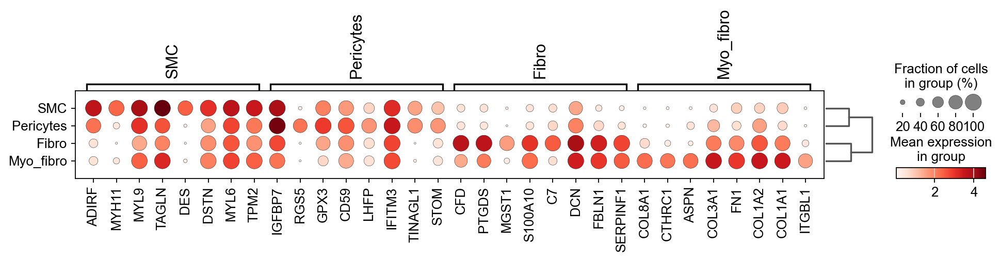

In [82]:
#visualize marker genes
sc.pl.rank_genes_groups_dotplot(adata, n_genes= 8)

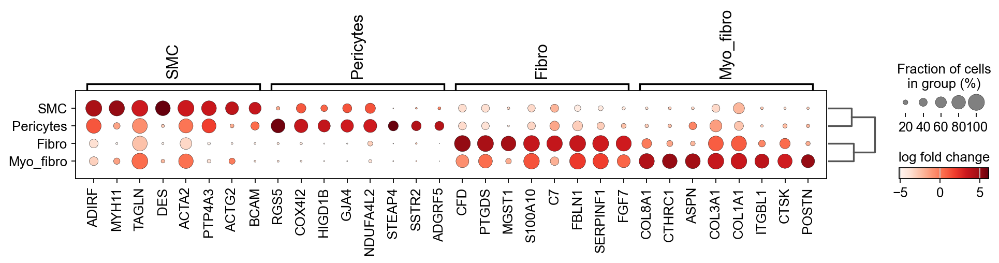

In [83]:
sc.pl.rank_genes_groups_dotplot(adata, values_to_plot='logfoldchanges', min_logfoldchange=3,n_genes= 8)

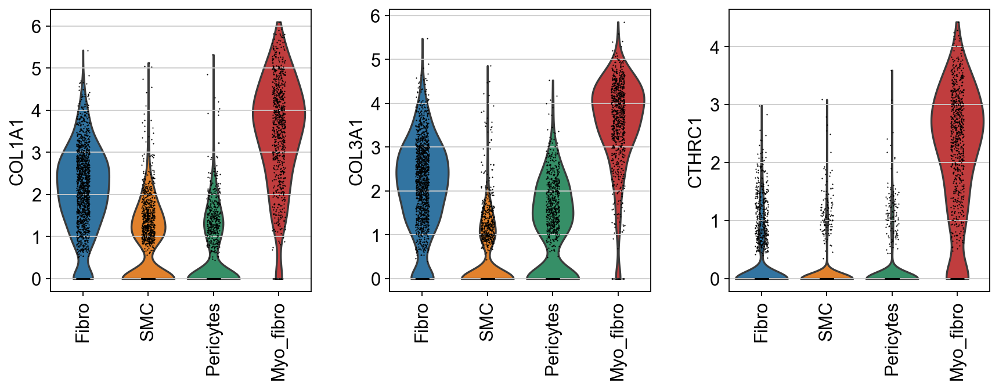

In [84]:
sc.pl.violin(adata, ['COL1A1', 'COL3A1', 'CTHRC1'], groupby= 'leiden', rotation= 90)

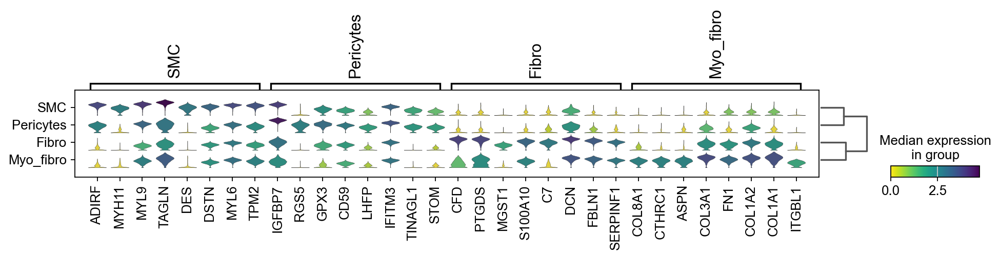

In [85]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes= 8, cmap= 'viridis_r')

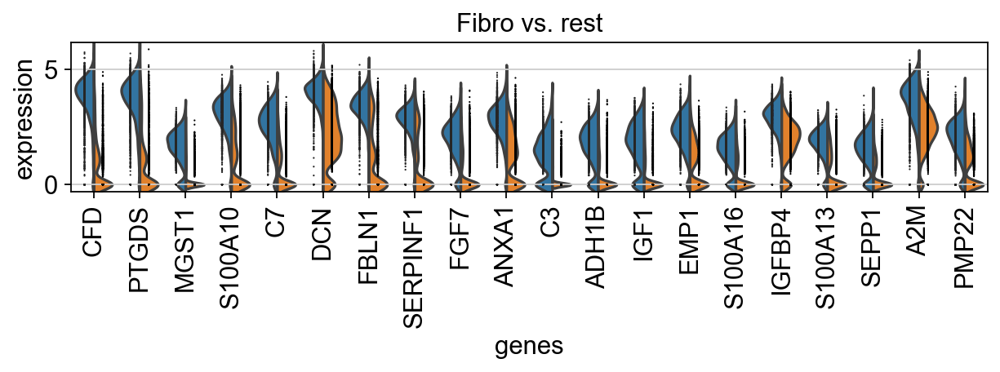

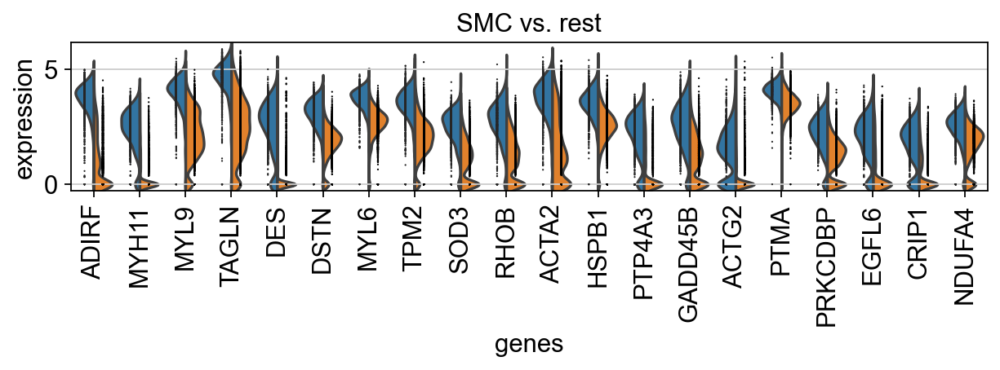

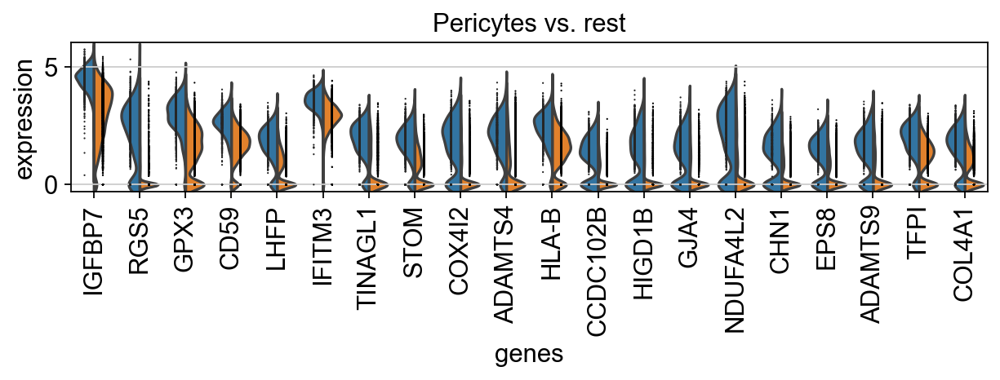

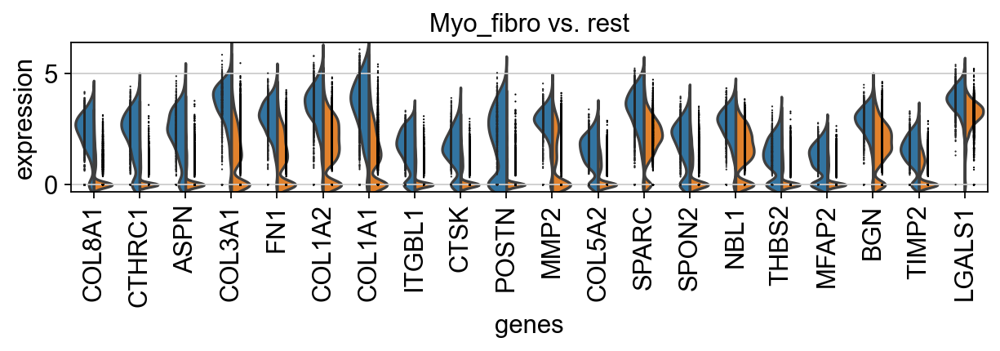

In [86]:
with rc_context({'figure.figsize': (9, 1.5)}):
    sc.pl.rank_genes_groups_violin(adata, n_genes= 20, jitter= False)

{'heatmap_ax': <Axes: >,
 'groupby_ax': <Axes: xlabel='leiden'>,
 'dendrogram_ax': <Axes: >,
 'gene_groups_ax': <Axes: >}

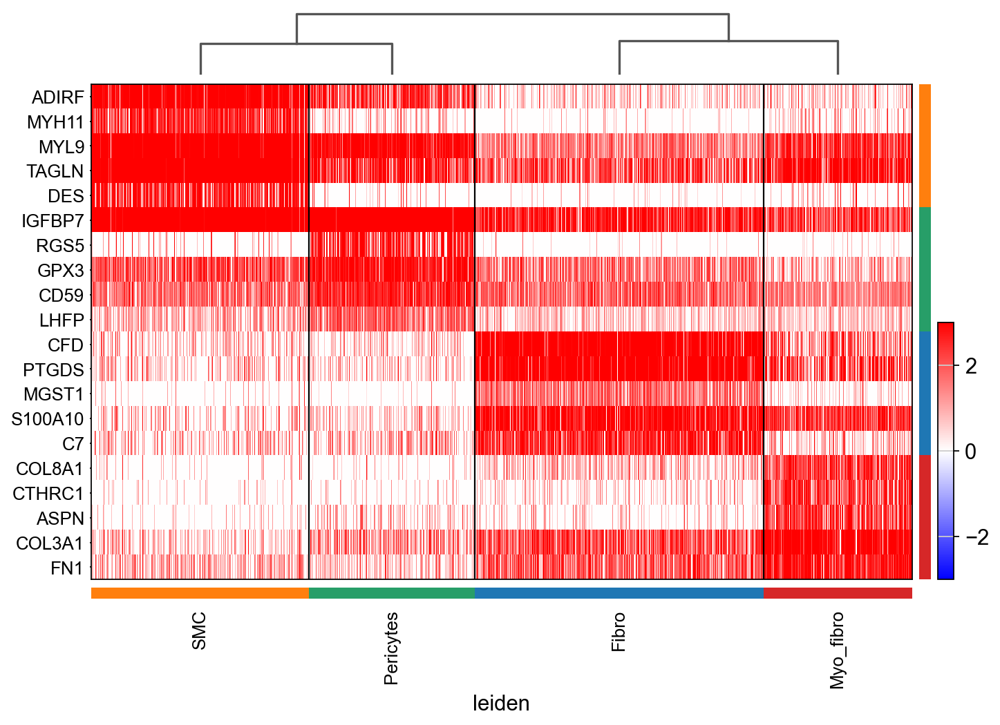

In [87]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes= 5, swap_axes= True, vmin=-3, vmax= 3, 
                               cmap= 'bwr', figsize= (10, 7), show= False)

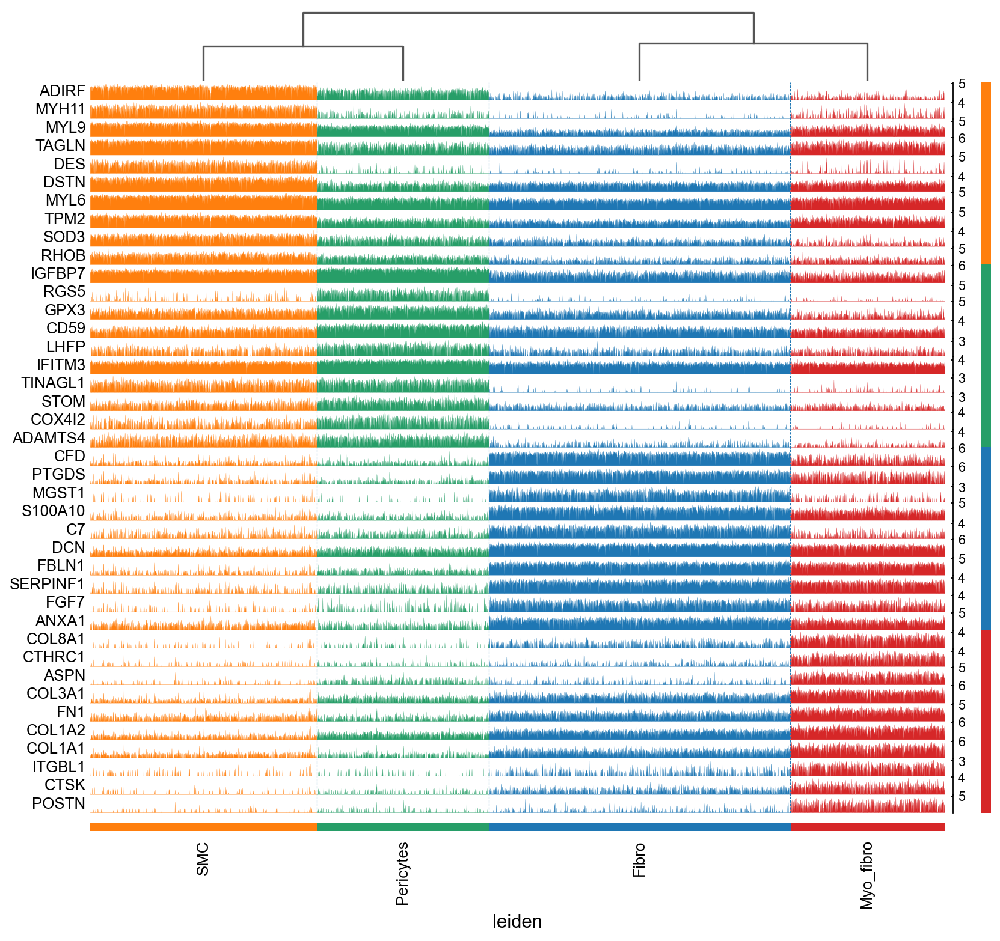

In [88]:
sc.pl.rank_genes_groups_tracksplot(adata, n_genes= 10)